**Student**: Valentina Milutinović IT31/2020

**Predmet**: Principi prezentacije i prepoznavanja oblika

# **Klasifikacija**

Klasifikacija je jedan od osnovnih zadataka u oblasti mašinskog učenja i
nadgledanog učenja. Cilj klasifikacije je da, na osnovu prethodno naučenih obrazaca iz skupa podataka, predvidi kojoj unapred definisanoj kategoriji (klasi) pripada novi, nepoznati podatak. Klasifikacija se koristi u mnogim aplikacijama, uključujući prepoznavanje objekata na slikama, klasifikaciju tekstova, dijagnostiku bolesti i mnoge druge.

Klasifikacija slika je zadatak u kojem se slike razvrstavaju u jednu od nekoliko unapred definisanih kategorija. Ovo je jedan od osnovnih problema u oblasti računarske vizije, sa širokom primenom u prepoznavanju objekata, medicinskoj dijagnostici, autonomnim vozilima i mnogim drugim poljima.


**Principi klasifikacije**



**Trening podaci**: Skup podataka sa poznatim klasnim oznakama koristi se za treniranje modela. Svaki podatak u trening skupu sadrži ulazne karakteristike (features) i pripadajuću klasu (label).

**Treniranje modela**: Algoritam mašinskog učenja analizira trening podatke i uči obrasce koji povezuju ulazne karakteristike sa odgovarajućim klasnim oznakama. Ovaj proces uključuje optimizaciju parametara modela kako bi se minimizovala greška u predikciji.

**Validacija i testiranje**: Nakon treniranja, model se validira i testira na odvojenom skupu podataka koji nije korišćen tokom treniranja. Cilj je proceniti performanse modela i osigurati da se naučeni obrasci generalizuju i na nove, nepoznate podatke.

**Predikcija**: Kada je model treniran i validiran, može se koristiti za klasifikaciju novih podataka. Model analizira ulazne karakteristike novih podataka i predviđa kojoj klasi ti podaci najverovatnije pripadaju.


Klasifikacija je ključna komponenta mnogih sistema mašinskog učenja i omogućava automatizovano donošenje odluka na osnovu analiziranih podataka. U ovom projektu, koristili smo klasifikaciju kako bismo identifikovali likove na slikama LEGO figura koristeći algoritam **DenseNet121**.

## **1. Instalacija i preuzimanje podataka**


1.  **gdown**: Instalira se alatka za preuzimanje fajlova sa Google Drive-a.
2.  **gdown.download**: Preuzima fajl sa zadatim URL-om.
3.  **numpy**: Za rad sa nizovima.
4.  **pandas**: Za rad sa data frame-ovima.
5.  **seaborn**: Vizualizacija podataka
6.  **cv2**: OpenCV za obradu slika.
7.   **os**: Rad sa fajlovima i direktorijumima.
8.  **tensorflow**: Za rad sa dubokim učenjem.
9.  **sklearn**: Za podelu podataka na treniranje i validaciju.
10.  **matplotlib**: Vizualizacija slika i grafikona.


In [1]:
!pip install gdown

In [2]:
import gdown

In [3]:
!gdown --fuzzy https://drive.google.com/file/d/1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk/view?pli=1

Downloading...
From (original): https://drive.google.com/uc?id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk
From (redirected): https://drive.google.com/uc?id=1RxKmPkhzCZFK-w7s3KC5ljsHOOu53VMk&confirm=t&uuid=6d569e9b-41d1-4cda-b503-14ec3c8ab277
To: /content/LEGO_Classification.zip
100% 30.2M/30.2M [00:01<00:00, 27.0MB/s]


In [4]:
!unzip LEGO_Classification.zip

Archive:  LEGO_Classification.zip
  inflating: LICENSE                 
  inflating: harry-potter/0001/001.jpg  
  inflating: harry-potter/0001/002.jpg  
  inflating: harry-potter/0001/003.jpg  
  inflating: harry-potter/0001/004.jpg  
  inflating: harry-potter/0001/005.jpg  
  inflating: harry-potter/0001/006.jpg  
  inflating: harry-potter/0001/007.jpg  
  inflating: harry-potter/0001/008.jpg  
  inflating: harry-potter/0001/009.jpg  
  inflating: harry-potter/0001/010.jpg  
  inflating: harry-potter/0001/011.jpg  
  inflating: harry-potter/0001/012.jpg  
  inflating: harry-potter/0001/013.jpg  
  inflating: harry-potter/0002/001.jpg  
  inflating: harry-potter/0002/002.jpg  
  inflating: harry-potter/0002/003.jpg  
  inflating: harry-potter/0002/004.jpg  
  inflating: harry-potter/0002/005.jpg  
  inflating: harry-potter/0002/006.jpg  
  inflating: harry-potter/0002/007.jpg  
  inflating: harry-potter/0002/008.jpg  
  inflating: harry-potter/0002/009.jpg  
  inflating: harry-potter/

In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
import cv2
import os

In [6]:
import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten,Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import load_img,img_to_array

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

## **2. Prikaz uzorka slika**

Ovaj deo koda se koristi za prikazivanje slika iz tri različita direktorijuma. Prvo se definišu putanje do direktorijuma i indeksi slika, a zatim se koristi *for* petlja da se učita i prikaže svaka slika na odgovarajućoj poziciji na slici koja će biti prikazana. Na kraju se slika sa prikazanim slikama prikazuje pomoću *plt.show()*.

Prikazuje se 3x3 mreža slika iz tri različite kategorije.

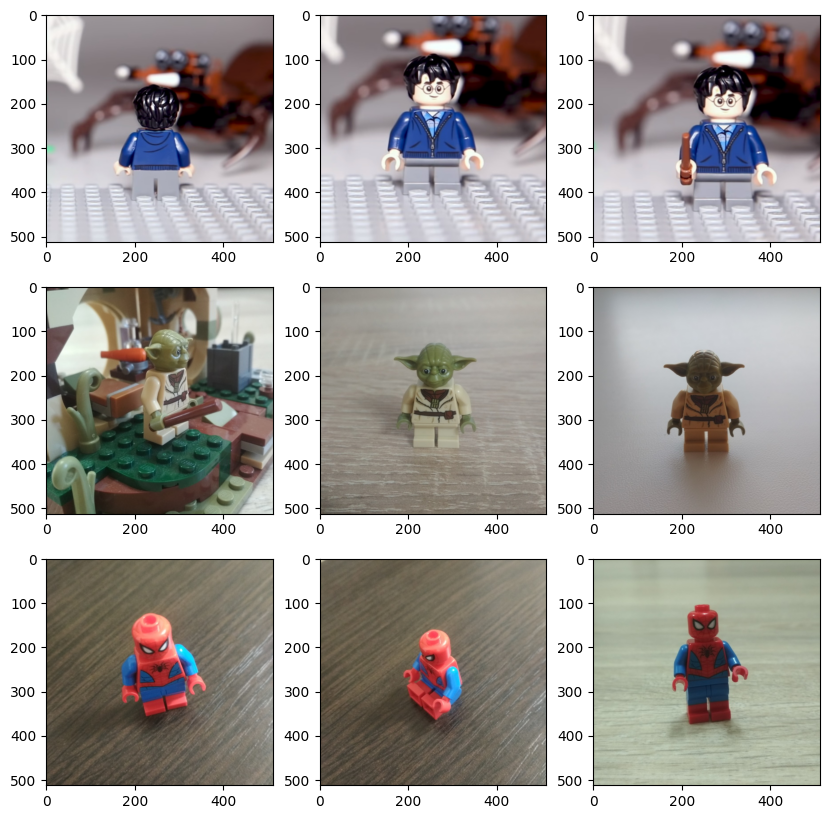

In [7]:
image_paths = ['harry-potter/0001/', 'star-wars/0001/', 'marvel/0001/']
index = ['001', '002', '003']

fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i in range(3):
    for j in range(3):
        image_path = os.path.join(image_paths[i], index[j] + '.jpg')
        image = mpimg.imread(image_path)
        axs[i, j].imshow(image)

plt.show()

Ovaj deo koda jednostavno čita CSV datoteku 'index.csv' i smešta podatke u *DataFrame* koji se naziva *index_df*.

In [8]:
index_df = pd.read_csv('index.csv')
index_df

,path,class_id
0,marvel/0001/001.jpg,1
1,marvel/0001/002.jpg,1
2,marvel/0001/003.jpg,1
3,marvel/0001/004.jpg,1
4,marvel/0001/005.jpg,1
...,...,...
366,star-wars/0017/006.jpg,38
367,star-wars/0017/007.jpg,38
368,star-wars/0017/008.jpg,38
369,star-wars/0017/009.jpg,38


Ovaj deo koda čita CSV datoteku 'metadata.csv' i smešta podatke u DataFrame koji se zove metadata_df. Takođe, primenjuje se odgovarajuće kodiranje (*encoding*) za čitanje datoteke, što je u ovom slučaju '*latin-1*'.

In [9]:
metadata_df = pd.read_csv('metadata.csv', encoding='latin-1')
metadata_df

,class_id,lego_ids,lego_names,minifigure_name
0,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,2,[76115],['Spider Mech vs. Venom'],VENOM
2,3,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,4,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,5,[75208],"[""Yoda's Hut""]",YODA
5,6,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,7,[75208],"[""Yoda's Hut""]",R2-D2
7,8,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,9,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,10,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


Ova linija koda koristi funkciju pd.merge() iz pandas biblioteke za spajanje (merge) dva DataFrame-a, index_df i metadata_df, na osnovu kolone 'class_id'. Spajanje se vrši tako što se uzimaju samo one vrste koje imaju istu vrednost u koloni 'class_id' u oba DataFrame-a. Rezultat spajanja se smešta u novi DataFrame koji se naziva data_df, koji će sadržati kombinovane informacije iz oba DataFrame-a. Konkretno, iz metadata_df uzimamo samo kolone 'class_id' i 'minifigure_name' i to se spaja sa index_df na osnovu kolone 'class_id'.

In [10]:
data_df = pd.merge(index_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
data_df

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


In [11]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371 entries, 0 to 370
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   path             371 non-null    object
 1   class_id         371 non-null    int64 
 2   minifigure_name  371 non-null    object
dtypes: int64(1), object(2)
memory usage: 8.8+ KB


Prikazuje uzorak od 20 slika sa imenima figura.

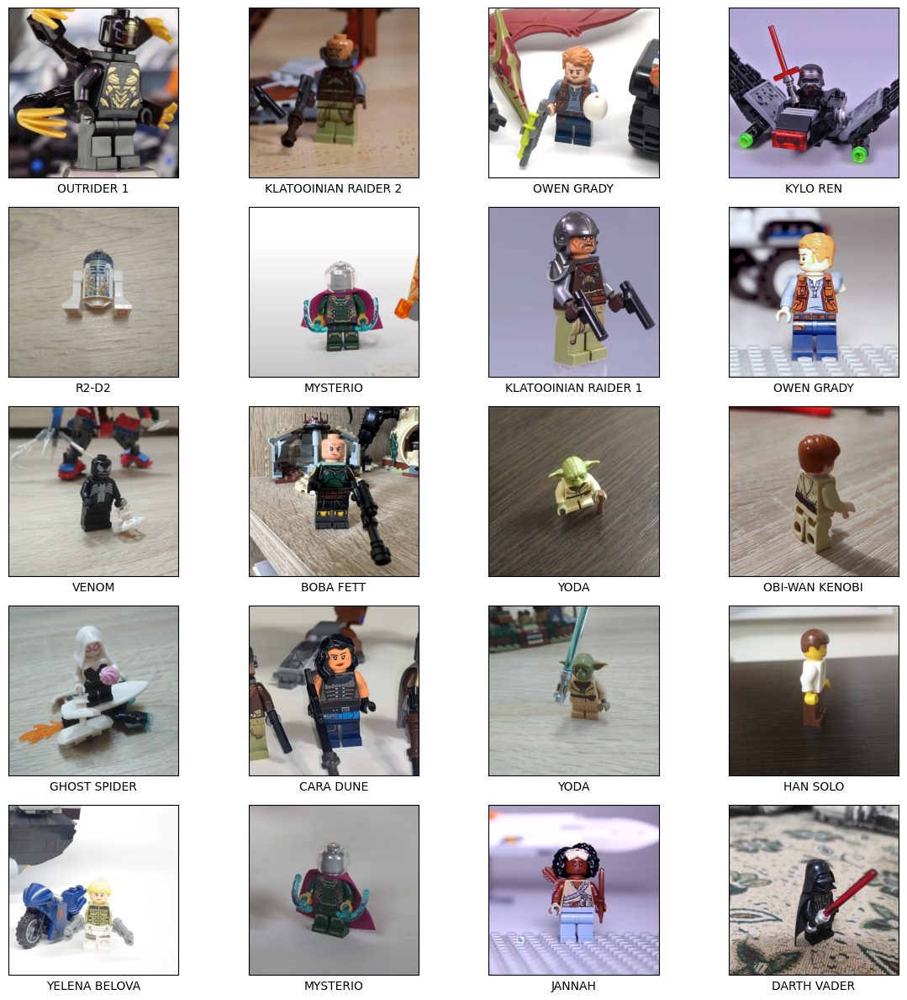

In [12]:
import matplotlib.gridspec as gridspec

sample_df = data_df.sample(20)

fig = plt.figure(figsize=(12, 12))
grid = gridspec.GridSpec(5, 4, figure=fig)

for i, (idx, row) in enumerate(sample_df.iterrows()):
    if i >= grid.get_geometry()[0] * grid.get_geometry()[1]:
        break
    ax = fig.add_subplot(grid[i])
    ax.grid(False)
    img = load_img(row['path'])
    ax.imshow(img)
    ax.set_xlabel(row['minifigure_name'])
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## **3. Priprema podataka za treniranje**

Ova linija koda čita *CSV* datoteku 'test.csv' i zatim u *DataFrame*-u *test_df* izdvaja sve kolone osim kolone 'class_id', smeštajući ih u *DataFrame* *X_test*.

In [13]:
test_df = pd.read_csv('test.csv')
X_test = test_df.drop(columns = ['class_id'])
X_test

,path
0,test/001.jpg
1,test/002.jpg
2,test/003.jpg
3,test/004.jpg
4,test/005.jpg
...,...
74,test/075.jpg
75,test/076.jpg
76,test/077.jpg
77,test/078.jpg


*y_test* sadrži ciljne vrednosti (*target values*) ili labele koje želimo da predvidimo ili klasifikujemo tokom testiranja modela.

In [14]:
y_test = test_df['class_id']
y_test

0     32
1     32
2     32
3     32
4      1
      ..
74    37
75    37
76    38
77    38
78    38
Name: class_id, Length: 79, dtype: int64

Sada se kombinuju informacije iz *DataFrame*-a *test_df* i *metadata_df* na osnovu kolone 'class_id' i sortira rezultujući *DataFrame* po koloni 'path'.

In [15]:
test_actual_df = pd.merge(test_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
test_actual_df = test_actual_df.sort_values('path')
test_actual_df

,path,class_id,minifigure_name
0,test/001.jpg,32,JANNAH
1,test/002.jpg,32,JANNAH
2,test/003.jpg,32,JANNAH
3,test/004.jpg,32,JANNAH
4,test/005.jpg,1,SPIDER-MAN
...,...,...,...
74,test/075.jpg,37,OBI-WAN KENOBI
75,test/076.jpg,37,OBI-WAN KENOBI
76,test/077.jpg,38,BOBA FETT
77,test/078.jpg,38,BOBA FETT


*X_data* će sadržavati sve informacije iz *DataFrame*-a *data_df* osim kolone 'class_id'.

In [16]:
X_data = data_df.drop(columns = ['class_id'])
X_data

,path,minifigure_name
0,marvel/0001/001.jpg,SPIDER-MAN
1,marvel/0001/002.jpg,SPIDER-MAN
2,marvel/0001/003.jpg,SPIDER-MAN
3,marvel/0001/004.jpg,SPIDER-MAN
4,marvel/0001/005.jpg,SPIDER-MAN
...,...,...
366,star-wars/0017/006.jpg,BOBA FETT
367,star-wars/0017/007.jpg,BOBA FETT
368,star-wars/0017/008.jpg,BOBA FETT
369,star-wars/0017/009.jpg,BOBA FETT


*y_data* sadrži ciljne vrednosti (*target values*) ili labele koje želimo da predvidimo ili klasifikujemo tokom treniranja modela.

In [17]:
y_data = data_df['class_id']
y_data

0       1
1       1
2       1
3       1
4       1
       ..
366    38
367    38
368    38
369    38
370    38
Name: class_id, Length: 371, dtype: int64

## **4. Konverzija slika u odgovarajući format**

**train_test_split**: Delimo podatke na trening i validacioni skup.

In [18]:
X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size=0.20, random_state= 8)

Slike se konvertuju u nizove dimenzija (224, 224, 3) i normalizuju se vrednosti.

In [19]:
X_train_converted = np.zeros((X_train.shape[0], 224, 224, 3))

for i in range(X_train.shape[0]):
    image = cv2.imread(X_train["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_train_converted[i] = image/255

y_train_converted = np.array(y_train)-1

In [20]:
X_train_converted[0]


array([[[0.69803922, 0.68627451, 0.66666667],
        [0.69411765, 0.68235294, 0.6627451 ],
        [0.69411765, 0.68235294, 0.65490196],
        ...,
        [0.59215686, 0.54509804, 0.49019608],
        [0.59607843, 0.54901961, 0.49411765],
        [0.59215686, 0.54509804, 0.49019608]],

       [[0.68627451, 0.6745098 , 0.65490196],
        [0.68627451, 0.6745098 , 0.64705882],
        [0.68235294, 0.67058824, 0.64313725],
        ...,
        [0.60392157, 0.55686275, 0.50196078],
        [0.60392157, 0.55686275, 0.50196078],
        [0.59607843, 0.54901961, 0.49411765]],

       [[0.67843137, 0.6627451 , 0.63921569],
        [0.67843137, 0.6627451 , 0.63921569],
        [0.6745098 , 0.65490196, 0.63137255],
        ...,
        [0.6       , 0.55294118, 0.49803922],
        [0.60392157, 0.55686275, 0.50196078],
        [0.6       , 0.55294118, 0.49803922]],

       ...,

       [[0.58431373, 0.55686275, 0.52156863],
        [0.66666667, 0.63529412, 0.61176471],
        [0.63529412, 0

Ovaj deo koda pretvara validacione slike u odgovarajući format za treniranje neuronske mreže. Svaka slika se učitava, skalira na veličinu 224x224 piksela, konvertuje u RGB format i normalizuje. Ciljne vrednosti se takođe konvertuju u numpy niz i smanjuju za 1.

In [21]:
X_val_converted = np.zeros((X_val.shape[0], 224, 224, 3))

for i in range(X_val.shape[0]):
    image = cv2.imread(X_val["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_val_converted[i] = image/255

y_val_converted = np.array(y_val)-1

In [22]:
X_val_converted[0]

array([[[0.37254902, 0.34117647, 0.2745098 ],
        [0.38823529, 0.34901961, 0.28235294],
        [0.38431373, 0.34901961, 0.28235294],
        ...,
        [0.56078431, 0.54901961, 0.48235294],
        [0.56470588, 0.54901961, 0.48235294],
        [0.55686275, 0.54509804, 0.47843137]],

       [[0.39215686, 0.36470588, 0.29411765],
        [0.41176471, 0.38431373, 0.31372549],
        [0.41176471, 0.37647059, 0.30980392],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.57254902, 0.56078431, 0.49411765],
        [0.56862745, 0.55686275, 0.49019608]],

       [[0.41960784, 0.39215686, 0.32156863],
        [0.41176471, 0.38431373, 0.31372549],
        [0.40392157, 0.37647059, 0.30588235],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.58039216, 0.56862745, 0.50196078],
        [0.56862745, 0.55686275, 0.49019608]],

       ...,

       [[0.30980392, 0.27058824, 0.23529412],
        [0.3372549 , 0.29803922, 0.2627451 ],
        [0.31372549, 0

In [23]:
X_test_converted = np.zeros((X_test.shape[0], 224, 224, 3))

for i in range(X_test.shape[0]-1):
    image = cv2.imread(X_test["path"].values[i])
    image = cv2.resize(image, dsize=(224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    X_test_converted[i] = image/255

y_test_converted = np.array(y_test)

## **5. Izgradnja i treniranje modela**

### **Dense Net**

DenseNet, ili Densely Connected Convolutional Network, je napredna arhitektura neuronske mreže. Ova arhitektura postala je popularna zbog svoje efikasnosti u treniranju dubokih mreža i postizanja visoke tačnosti u zadacima kao što je u ovom slučaju klasifikacija slika.

Glavna karakteristika DenseNet-a su guste (dense) veze između slojeva. Umesto tradicionalnog pristupa gde svaki sloj prima ulaz samo od prethodnog sloja, u DenseNet-u svaki sloj prima ulaz od svih prethodnih slojeva u bloku. Ovo omogućava direktno deljenje informacija između svih slojeva, što olakšava učenje i omogućava bolje iskorišćavanje informacija tokom propagacije unapred i propagacije gradijenata unazad.

Prednosti DenseNet-a uključuju:

* Efikasnost u učenju: Guste veze olakšavaju protok informacija i gradijenata kroz mrežu, što dovodi do bržeg i stabilnijeg učenja.

* Manji broj parametara: Zbog deljenja informacija, DenseNet ima manji broj parametara u odnosu na druge duboke arhitekture, što olakšava treniranje i smanjuje rizik od prenaučenosti.

* Bolje iskorišćavanje karakteristika: Guste veze omogućavaju bolje iskorišćavanje naučenih karakteristika u svim delovima mreže, što dovodi do boljih performansi.

U kontekstu klasifikacije slika LEGO figura, DenseNet bi bio odabran kao arhitektura neuronske mreže za ekstrakciju karakteristika iz slika i klasifikaciju na osnovu tih karakteristika. Ova arhitektura bi omogućila efikasno učenje i visoku tačnost u predikciji klasa likova na slikama LEGO figura.

1. **DenseNet121**: Koristi se unapred trenirani DenseNet121 model.
2. **Dropout**: Dodaje dropout sloj za regularizaciju.
3. **Dense**: Dodaje izlazni sloj sa softmax aktivacijom.
4. **ModelCheckpoint**: Čuva najbolju verziju modela.
5. **EarlyStopping**: Zaustavlja treniranje ako se validacija ne poboljšava.





Kreiranje modela na osnovu DenseNet121

In [24]:
from tensorflow.keras.applications import DenseNet121
dense_net = tf.keras.applications.DenseNet121()

dense_net_layer=Dropout(0.5)(dense_net.layers[-2].output)
number_of_classes = len(data_df['class_id'].unique())

last_layer = Dense(number_of_classes, activation="softmax")(dense_net_layer)
model = Model(dense_net.input, last_layer)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(0.0001),
              metrics=['accuracy'])

33188688/33188688 [==============================] - 0s 0us/step


Čuvanje najboljeg modela tokom treniranja

In [25]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(filepath='model.h5', monitor="val_accuracy", save_best_only=True, verbose=1)

Rano zaustavljanje treninga ako se performanse ne poboljšavaju

In [26]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)

Treniranje modela

In [28]:
hist=model.fit(
    X_train_converted,
    y_train_converted,
    epochs=50,
    validation_data=(X_val_converted, y_val_converted),
    shuffle=True,
    batch_size=10,
    callbacks=[checkpoint, early_stopping]
)

Epoch 1/50
30/30 [==============================] - ETA: 0s - loss: 0.0771 - accuracy: 1.0000
Epoch 1: val_accuracy did not improve from 0.93333
30/30 [==============================] - 255s 8s/step - loss: 0.0771 - accuracy: 1.0000 - val_loss: 0.4933 - val_accuracy: 0.9333
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 0.0775 - accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.93333 to 0.94667, saving model to model.h5
30/30 [==============================] - 246s 8s/step - loss: 0.0775 - accuracy: 1.0000 - val_loss: 0.4548 - val_accuracy: 0.9467
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 0.0746 - accuracy: 1.0000
Epoch 3: val_accuracy did not improve from 0.94667
30/30 [==============================] - 254s 9s/step - loss: 0.0746 - accuracy: 1.0000 - val_loss: 0.4464 - val_accuracy: 0.9467
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 0.0534 - accuracy: 1.0000
Epoch 4: val_accuracy did not improve from 0.94667


## **6. Evaluacija modela**

Prikaz rezultata treniranja (grafici tačnosti i gubitka)

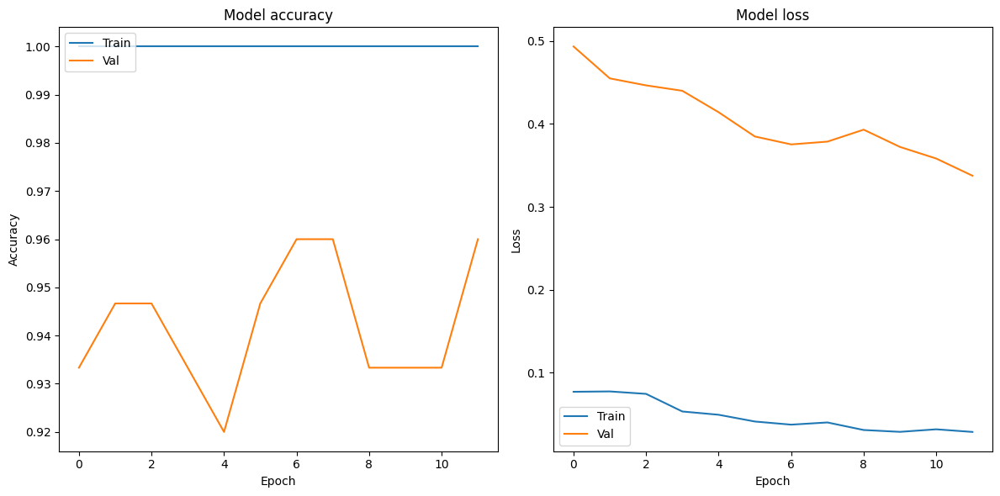

In [29]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.plot(hist.history['accuracy'])
ax1.plot(hist.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Val'], loc='upper left')

ax2.plot(hist.history['loss'])
ax2.plot(hist.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Val'], loc='lower left')

plt.tight_layout()
plt.show()

Učitava model i prikazuje predikcije za test slike.
Evaluira se model na validacionom skupu.

In [30]:
from tensorflow.keras import models as tf_models

model = tf_models.load_model('model.h5')

Prikaz predikcije za testni skup podataka

1/1 [==============================] - 3s 3s/step


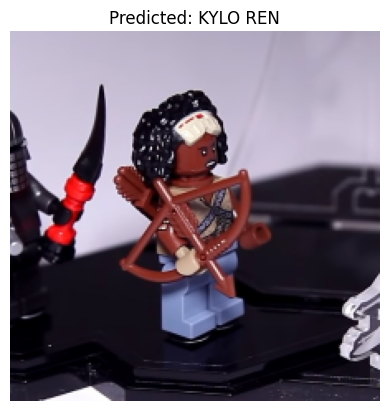

1/1 [==============================] - 0s 253ms/step


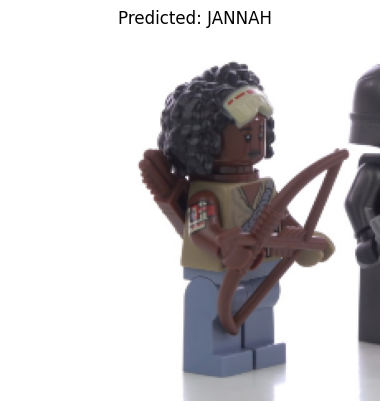

1/1 [==============================] - 0s 278ms/step


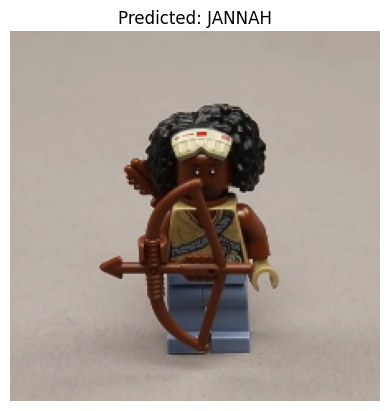

1/1 [==============================] - 0s 275ms/step


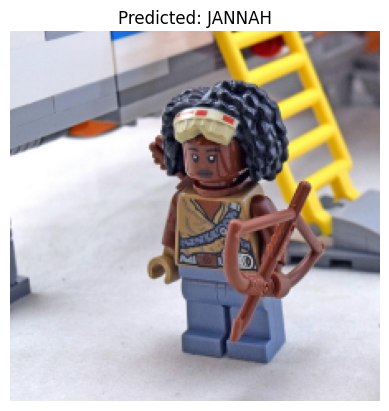

1/1 [==============================] - 0s 279ms/step


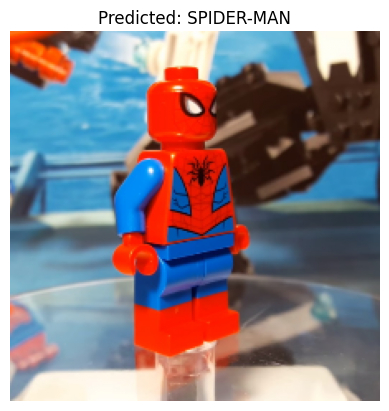

1/1 [==============================] - 0s 307ms/step


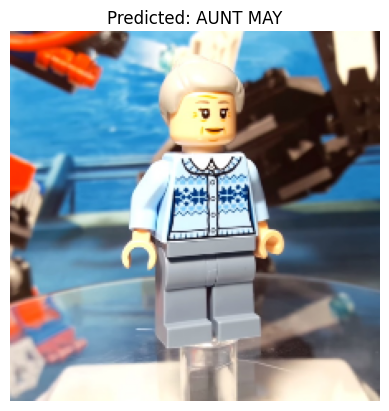

1/1 [==============================] - 0s 314ms/step


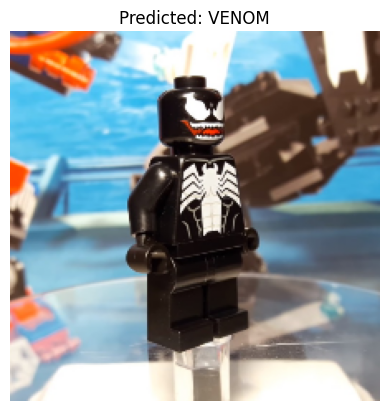

1/1 [==============================] - 0s 323ms/step


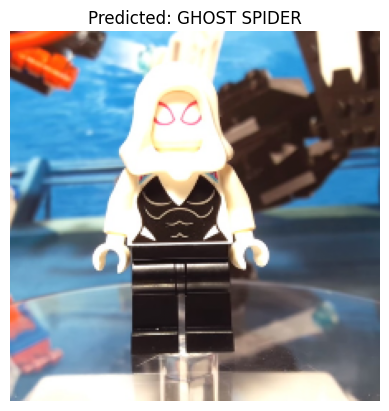

1/1 [==============================] - 0s 273ms/step


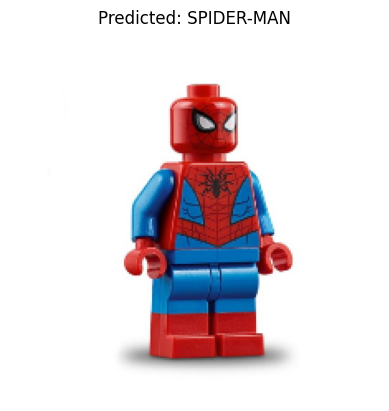

1/1 [==============================] - 0s 270ms/step


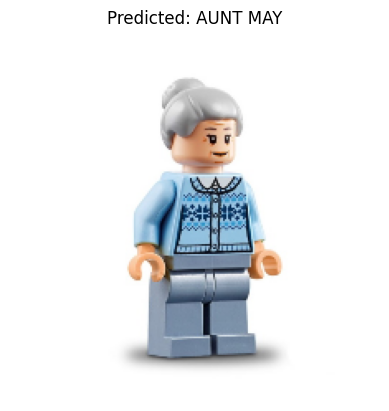

1/1 [==============================] - 0s 260ms/step


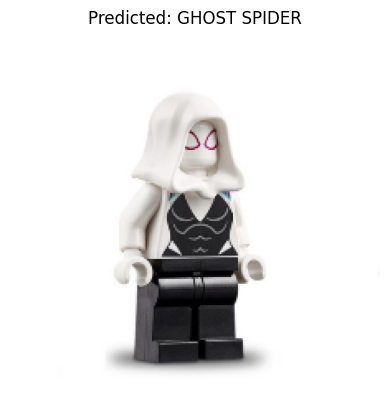

1/1 [==============================] - 0s 275ms/step


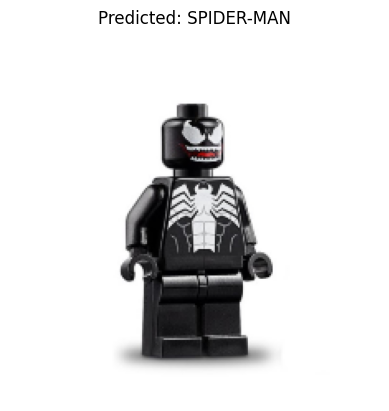

1/1 [==============================] - 0s 285ms/step


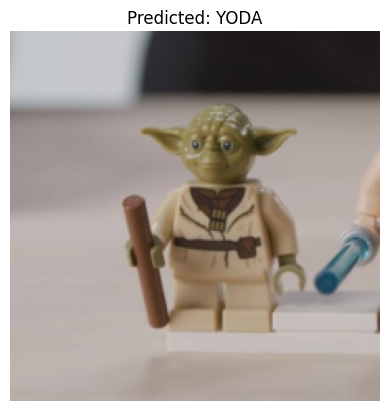

1/1 [==============================] - 0s 159ms/step


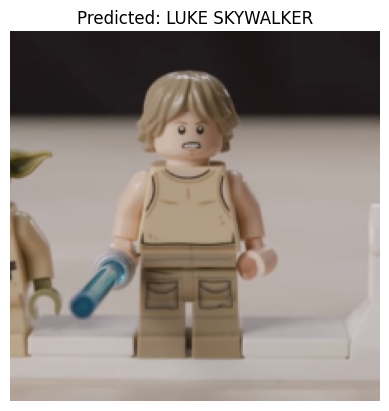

1/1 [==============================] - 0s 181ms/step


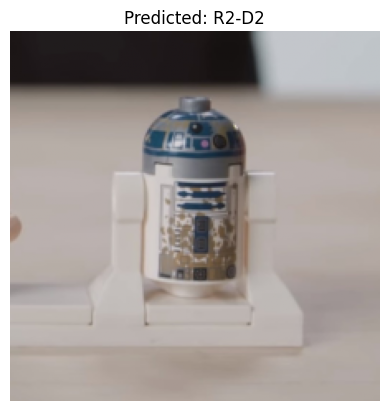

1/1 [==============================] - 0s 170ms/step


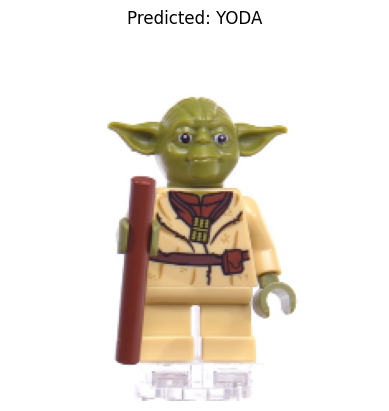

1/1 [==============================] - 0s 179ms/step


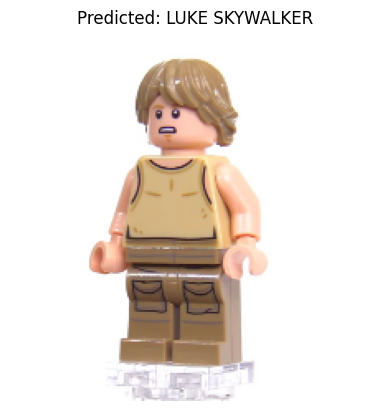

1/1 [==============================] - 0s 157ms/step


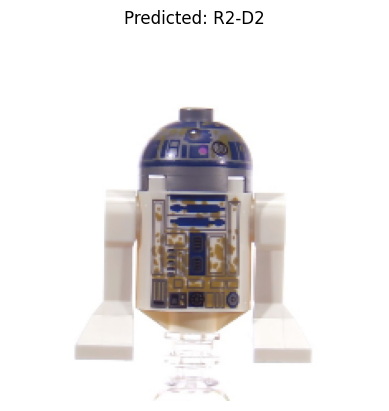

1/1 [==============================] - 0s 159ms/step


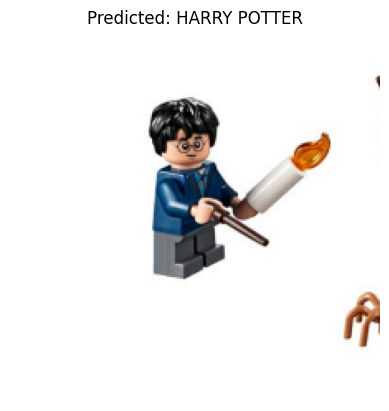

1/1 [==============================] - 0s 161ms/step


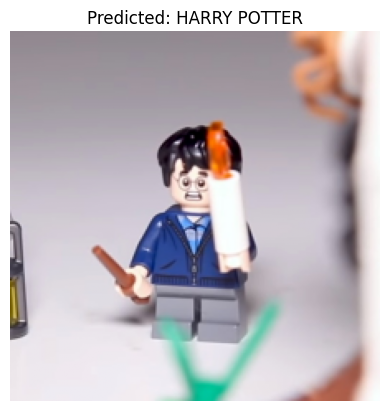

1/1 [==============================] - 0s 161ms/step


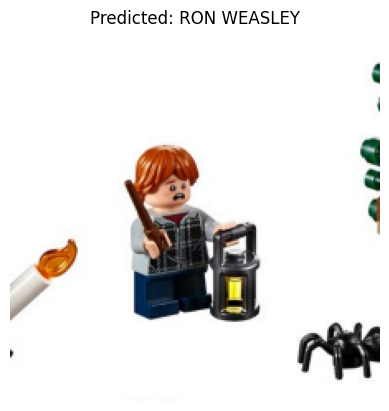

1/1 [==============================] - 0s 149ms/step


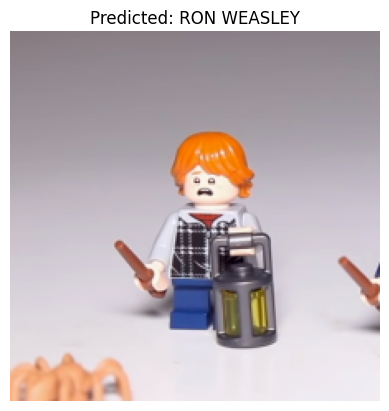

1/1 [==============================] - 0s 157ms/step


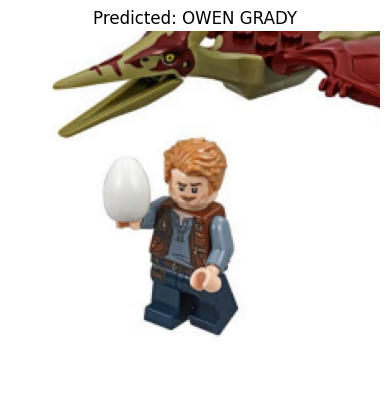

1/1 [==============================] - 0s 146ms/step


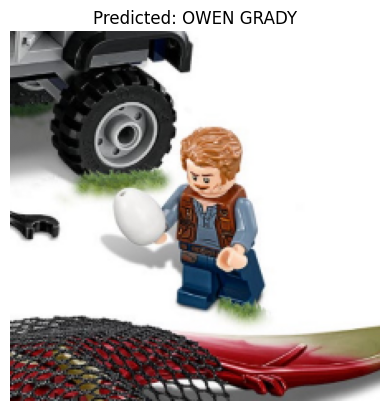

1/1 [==============================] - 0s 164ms/step


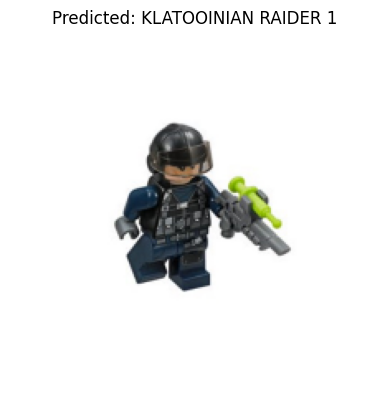

1/1 [==============================] - 0s 268ms/step


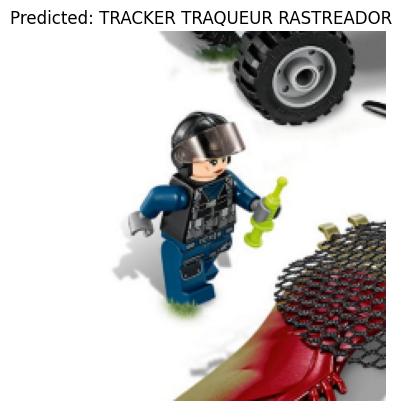

1/1 [==============================] - 0s 274ms/step


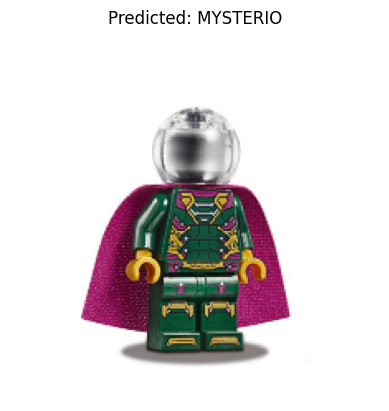

1/1 [==============================] - 0s 291ms/step


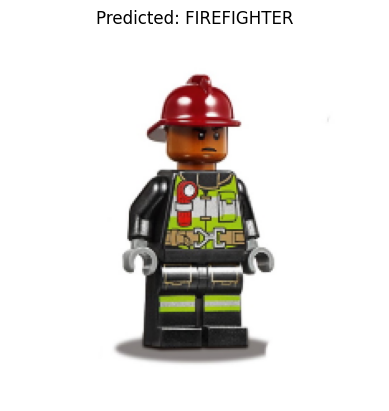

1/1 [==============================] - 0s 279ms/step


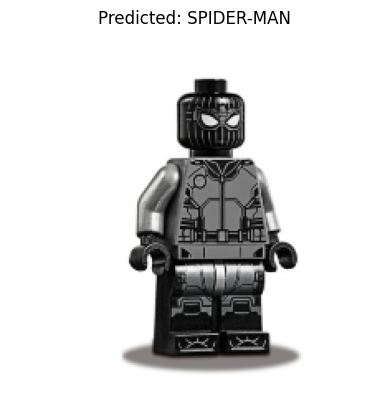

1/1 [==============================] - 0s 252ms/step


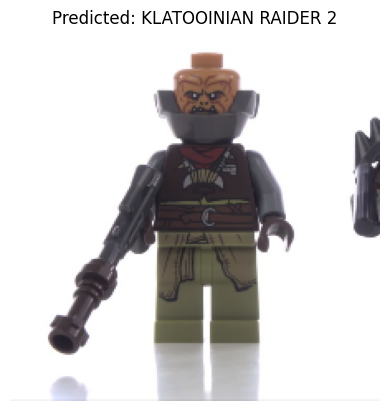

1/1 [==============================] - 0s 260ms/step


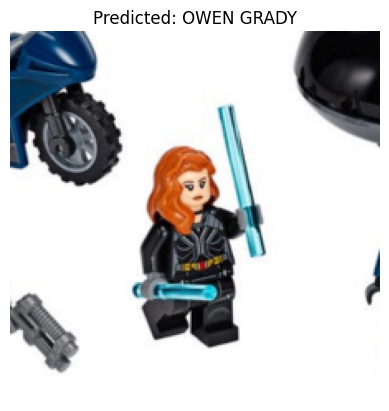

1/1 [==============================] - 0s 163ms/step


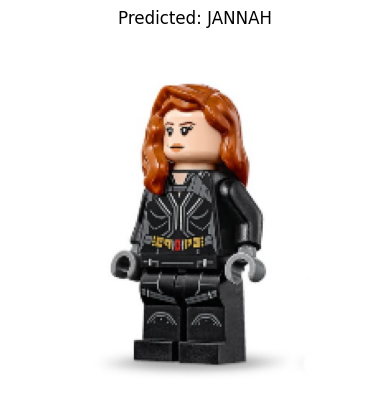

1/1 [==============================] - 0s 148ms/step


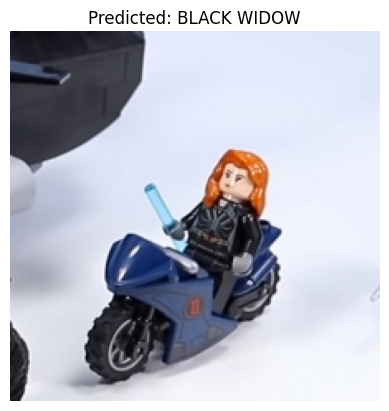

1/1 [==============================] - 0s 155ms/step


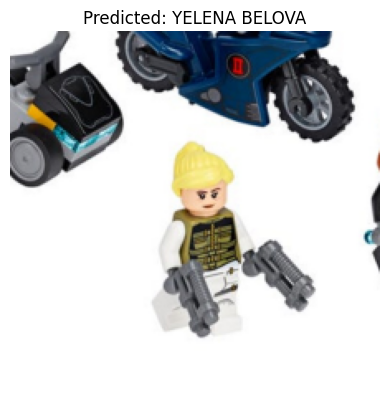

1/1 [==============================] - 0s 163ms/step


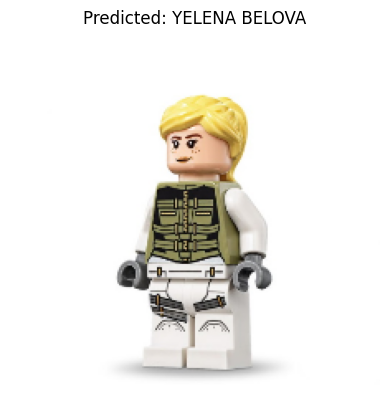

1/1 [==============================] - 0s 166ms/step


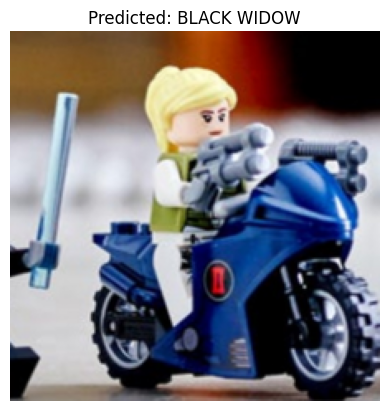

1/1 [==============================] - 0s 148ms/step


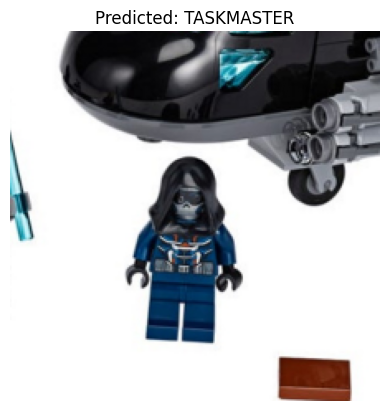

1/1 [==============================] - 0s 168ms/step


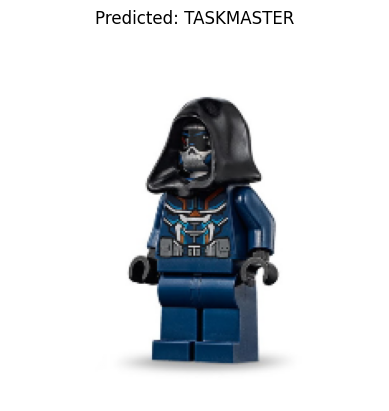

1/1 [==============================] - 0s 156ms/step


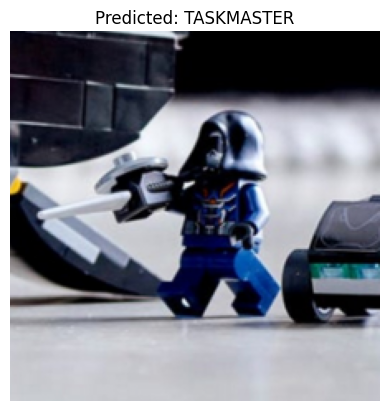

1/1 [==============================] - 0s 177ms/step


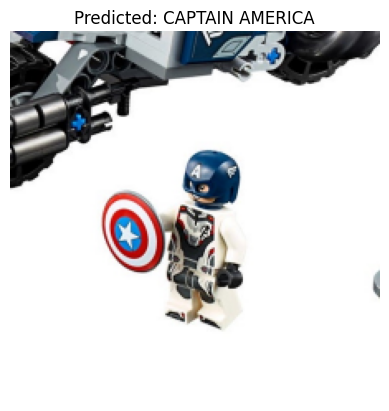

1/1 [==============================] - 0s 170ms/step


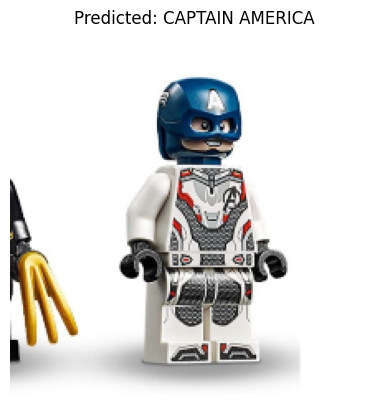

1/1 [==============================] - 0s 159ms/step


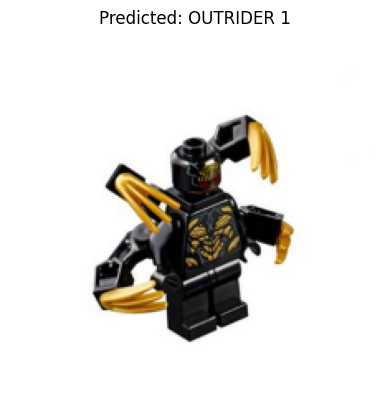

1/1 [==============================] - 0s 159ms/step


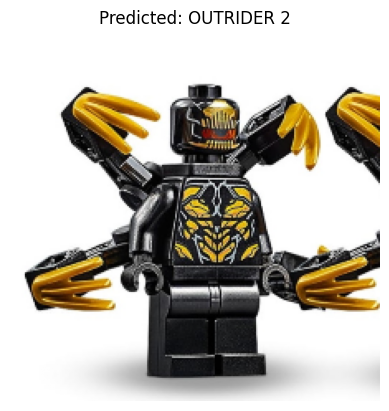

1/1 [==============================] - 0s 166ms/step


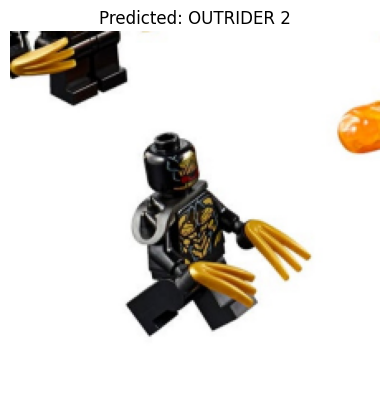

1/1 [==============================] - 0s 176ms/step


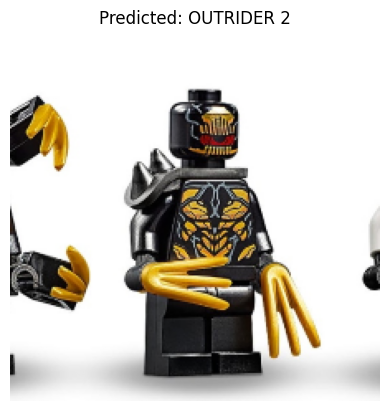

1/1 [==============================] - 0s 162ms/step


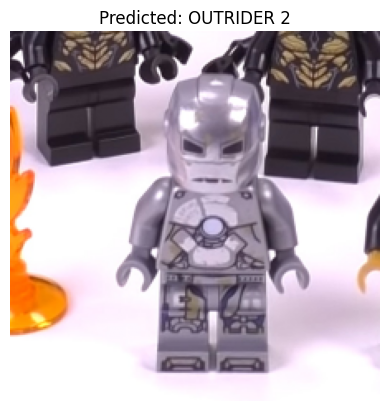

1/1 [==============================] - 0s 174ms/step


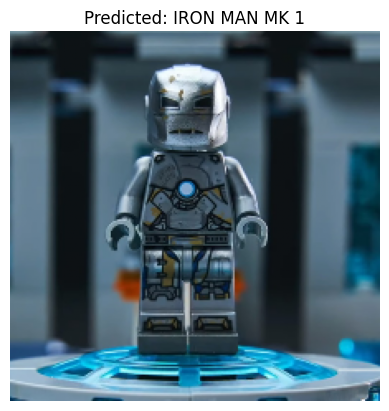

1/1 [==============================] - 0s 185ms/step


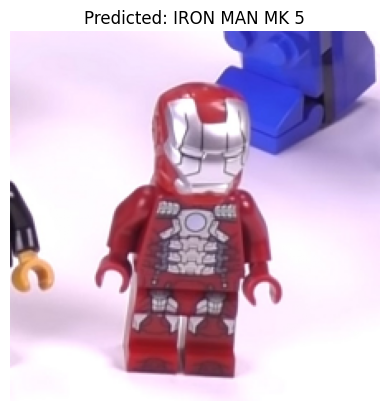

1/1 [==============================] - 0s 154ms/step


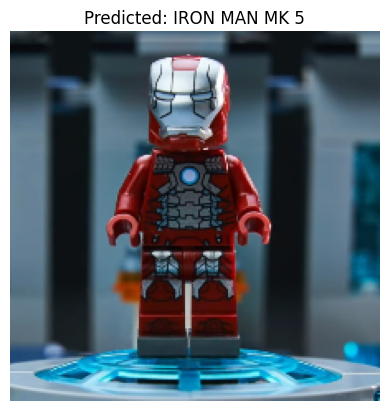

1/1 [==============================] - 0s 291ms/step


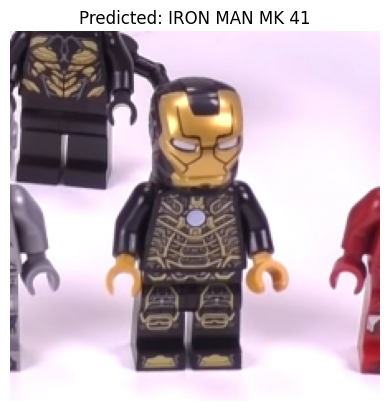

1/1 [==============================] - 0s 345ms/step


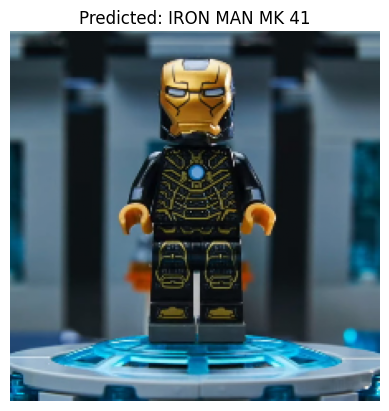

1/1 [==============================] - 0s 325ms/step


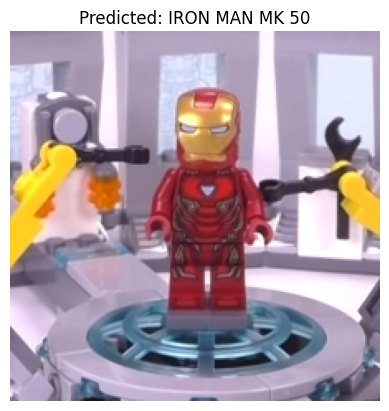

1/1 [==============================] - 0s 327ms/step


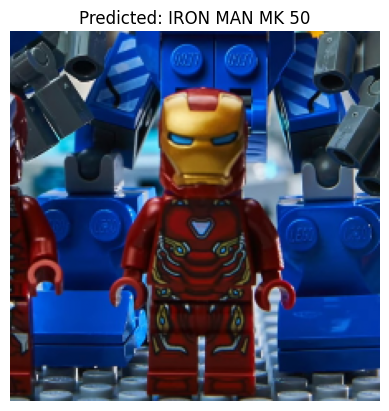

1/1 [==============================] - 0s 299ms/step


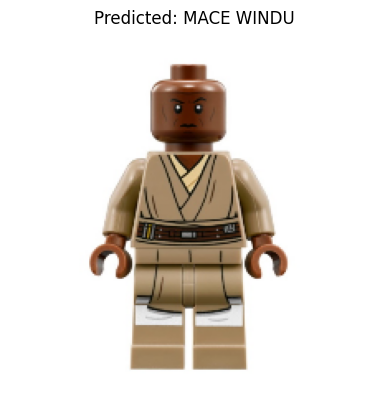

1/1 [==============================] - 0s 345ms/step


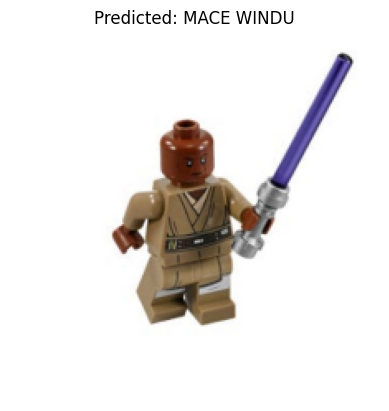

1/1 [==============================] - 0s 310ms/step


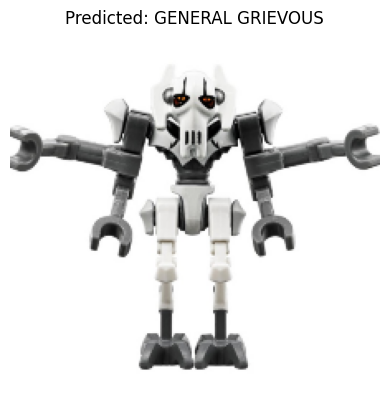

1/1 [==============================] - 0s 182ms/step


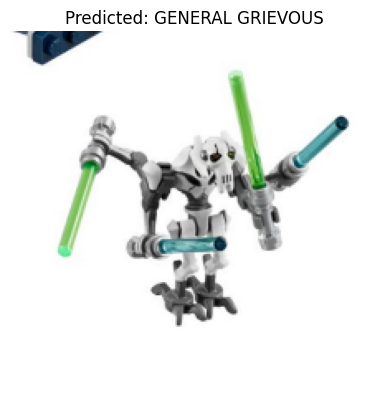

1/1 [==============================] - 0s 165ms/step


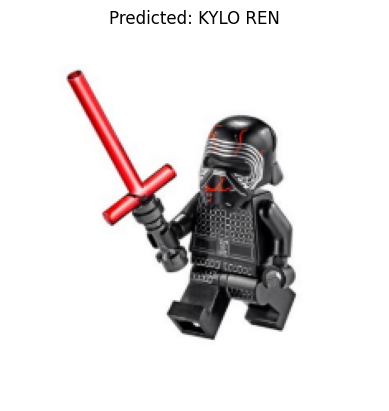

1/1 [==============================] - 0s 211ms/step


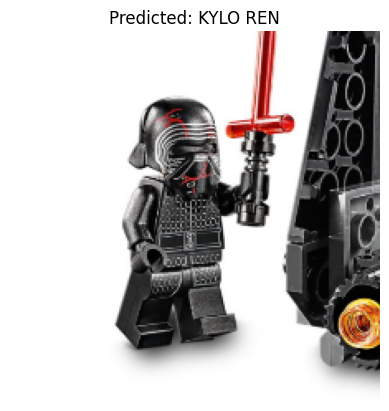

1/1 [==============================] - 0s 174ms/step


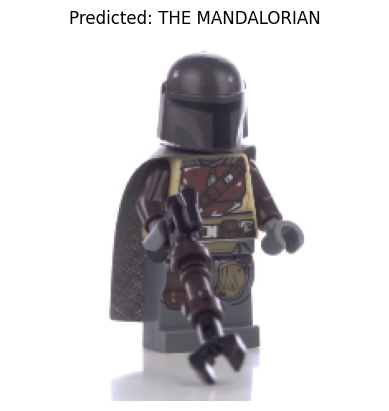

1/1 [==============================] - 0s 189ms/step


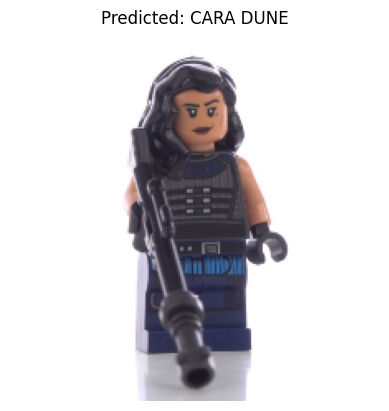

1/1 [==============================] - 0s 168ms/step


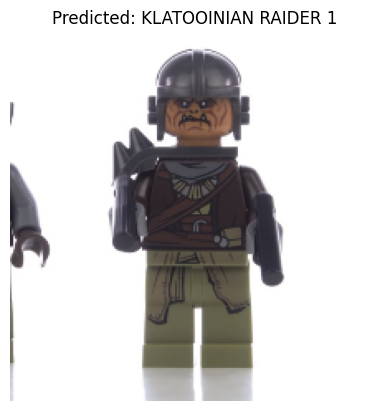

1/1 [==============================] - 0s 179ms/step


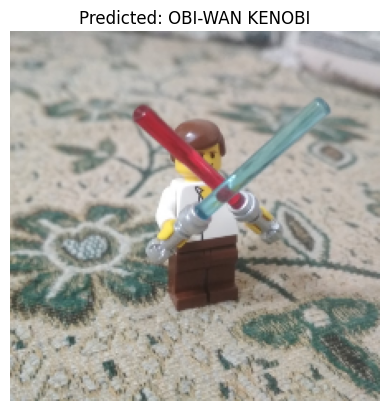

1/1 [==============================] - 0s 172ms/step


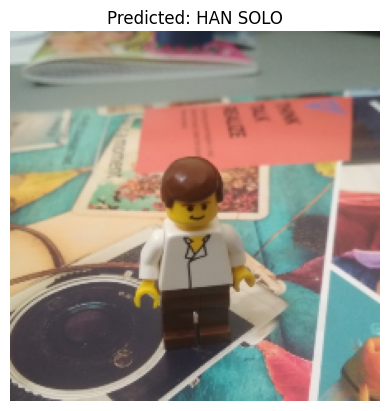

1/1 [==============================] - 0s 194ms/step


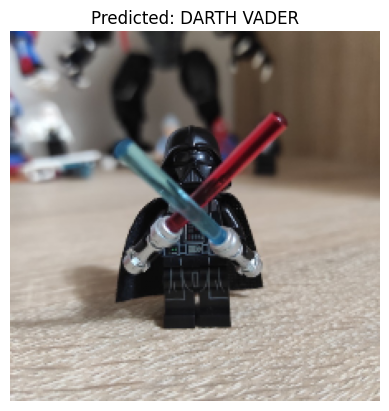

1/1 [==============================] - 0s 190ms/step


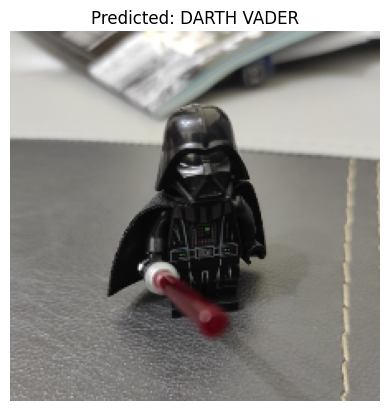

1/1 [==============================] - 0s 196ms/step


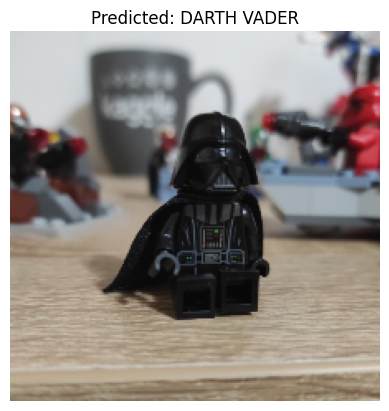

1/1 [==============================] - 0s 178ms/step


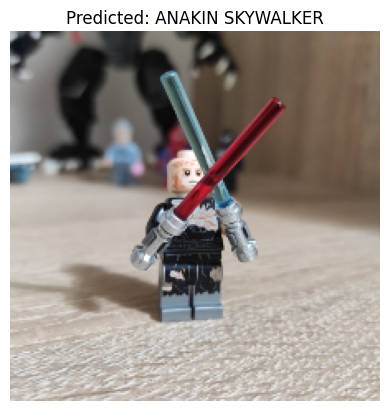

1/1 [==============================] - 0s 188ms/step


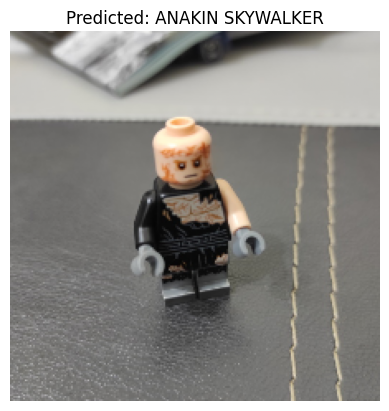

1/1 [==============================] - 0s 304ms/step


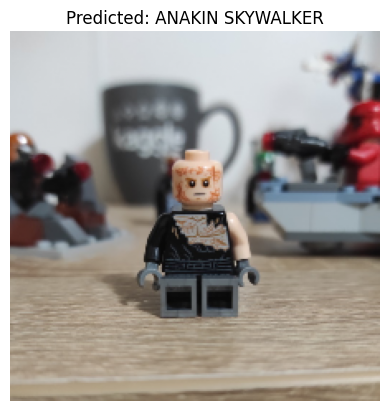

1/1 [==============================] - 0s 303ms/step


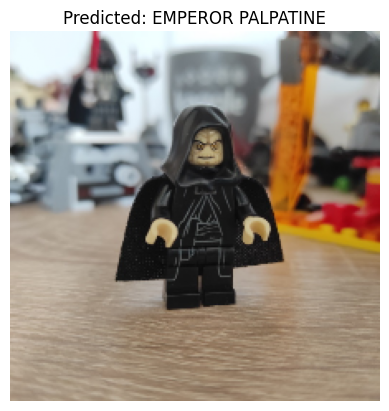

1/1 [==============================] - 0s 320ms/step


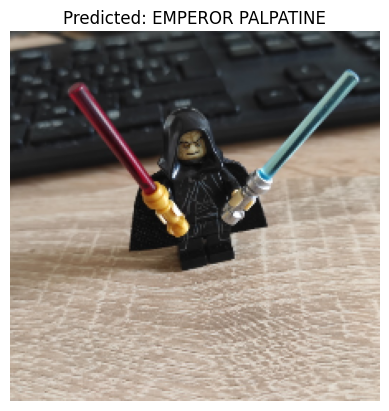

1/1 [==============================] - 0s 394ms/step


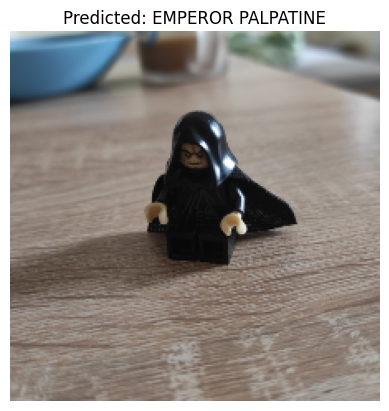

1/1 [==============================] - 0s 307ms/step


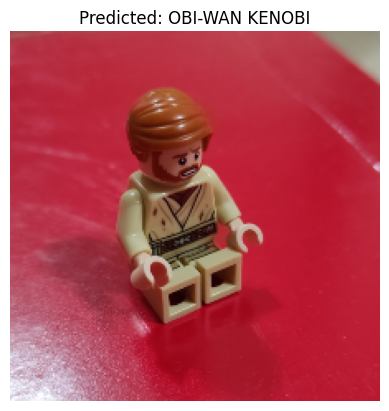

1/1 [==============================] - 0s 288ms/step


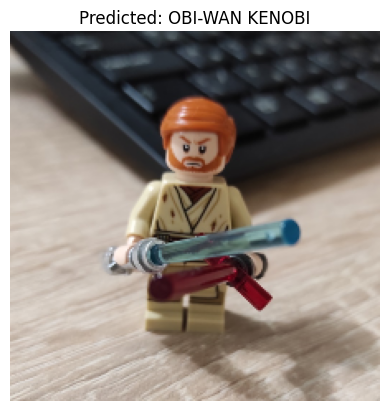

1/1 [==============================] - 0s 373ms/step


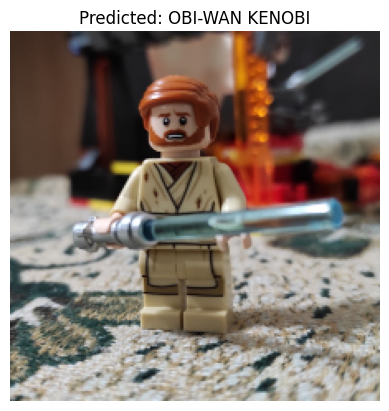

1/1 [==============================] - 0s 273ms/step


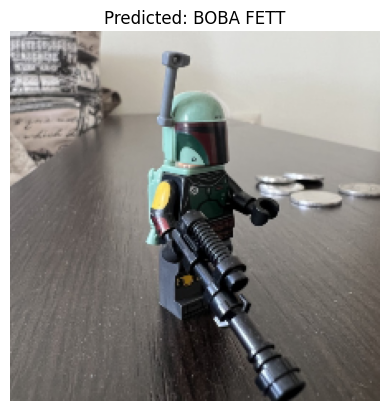

1/1 [==============================] - 0s 297ms/step


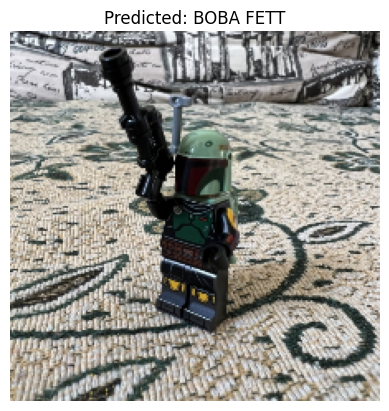

1/1 [==============================] - 0s 290ms/step


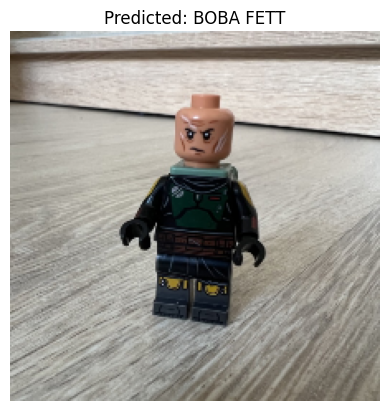

In [31]:
for i in range(len(X_test_converted)):
    image = cv2.imread(X_test['path'].values[i])
    image = cv2.resize(image, dsize=(224, 224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) / 255.0

    plt.imshow(image)
    plt.axis('off')

    # Predikcija
    img_array = np.expand_dims(image, axis=0)
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions)
    predicted_minifigure = metadata_df.loc[metadata_df['class_id'] == predicted_class+1, 'minifigure_name'].values[0]

    plt.title(f"Predicted: {predicted_minifigure}")
    plt.show()


Evaluacija modela na validacionom skupu podataka


In [32]:
loss, accuracy = model.evaluate(X_val_converted, y_val_converted, verbose=1)

print('Test loss:', loss)
print('Test accuracy:', accuracy)

3/3 [==============================] - 14s 3s/step - loss: 0.3752 - accuracy: 0.9600
Test loss: 0.3752172589302063
Test accuracy: 0.9599999785423279


## **Zaključak**

U ovom projektu proces je obuhvatao nekoliko ključnih koraka, od prikupljanja i pripreme podataka, preko izgradnje i treniranja modela, do evaluacije performansi modela na validacionom skupu podataka.

**Glavne tačke projekta**

**Prikupljanje i priprema podataka**: Učitani su podaci koji sadrže slike LEGO figura različitih likova. Podaci su podeljeni na trening, validacioni i test skup, a slike su konvertovane u odgovarajući format za unos u model.

**Izgradnja modela**: Koriščen je unapred trenirani model DenseNet121, na koji su dodati dodatni slojevi kako bi se model prilagodio zadatku klasifikacije. DenseNet121 je moćan alat za ekstrakciju karakteristika iz slika, što je omogućilo efikasnu klasifikaciju LEGO figura.

**Treniranje modela**: Model je treniran na trening skupu podataka uz korišćenje metoda kao što su *Dropout* za regularizaciju i *Adam* optimizator za brzu i stabilnu konvergenciju.

**Evaluacija i predikcija**: Model je evaluiran na validacionom skupu, a performanse su merene putem tačnosti i gubitka. Takođe, model je testiran na nepoznatim podacima kako bi se procenila njegova sposobnost generalizacije.

**Rezultati**

Model je postigao zadovoljavajuće rezultate na validacionom skupu podataka, pokazujući visoku tačnost u klasifikaciji slika LEGO figura. Kroz vizualizaciju rezultata, uverili smo se da model uspešno identifikuje različite likove sa velikom preciznošću. Kvalitetna priprema i normalizacija podataka bili su ključni za postizanje visokih performansi modela. Ovaj projekat demonstrira kako se napredne tehnike dubokog učenja mogu uspešno primeniti na zadatke klasifikacije slika. Dalje unapređenje modela moglo bi uključivati dodatnu finu prilagodbu hiperparametara, povećanje skupa podataka i istraživanje drugih arhitektura neuronskih mreža.

Na kraju, možemo zaključiti da je model sposoban da precizno klasifikuje slike LEGO figura, što može imati praktične primene u različitim oblastima, od e-trgovine do obrazovanja.